In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
plt.rcParams['figure.figsize']=(10,10)
plt.rcParams['figure.dpi']=500
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn import tree
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df=pd.read_csv('Company_Data.csv')
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban,US
0,9.50,138,73,11,276,120,Bad,42,17,Yes,Yes
1,11.22,111,48,16,260,83,Good,65,10,Yes,Yes
2,10.06,113,35,10,269,80,Medium,59,12,Yes,Yes
3,7.40,117,100,4,466,97,Medium,55,14,Yes,Yes
4,4.15,141,64,3,340,128,Bad,38,13,Yes,No
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,Yes,Yes
396,6.14,139,23,3,37,120,Medium,55,11,No,Yes
397,7.41,162,26,12,368,159,Medium,40,18,Yes,Yes
398,5.94,100,79,7,284,95,Bad,50,12,Yes,Yes


In [3]:
#getting information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    object 
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban        400 non-null    object 
 10  US           400 non-null    object 
dtypes: float64(1), int64(7), object(3)
memory usage: 34.5+ KB


In [4]:
df.shape

(400, 11)

In [5]:
df.isnull().any()

Sales          False
CompPrice      False
Income         False
Advertising    False
Population     False
Price          False
ShelveLoc      False
Age            False
Education      False
Urban          False
US             False
dtype: bool

In [6]:
# let's plot pair plot to visualise the attributes all at once
sns.pairplot(data=df, hue = 'ShelveLoc')

In [7]:
#Creating dummy vairables dropping first dummy variable
df=pd.get_dummies(df,columns=['Urban','US'],drop_first=True)
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,Bad,42,17,1,1
1,11.22,111,48,16,260,83,Good,65,10,1,1
2,10.06,113,35,10,269,80,Medium,59,12,1,1
3,7.40,117,100,4,466,97,Medium,55,14,1,1
4,4.15,141,64,3,340,128,Bad,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,Good,33,14,1,1
396,6.14,139,23,3,37,120,Medium,55,11,0,1
397,7.41,162,26,12,368,159,Medium,40,18,1,1
398,5.94,100,79,7,284,95,Bad,50,12,1,1


In [8]:
df['ShelveLoc']=df['ShelveLoc'].map({'Good':1,'Medium':2,'Bad':3})

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 400 entries, 0 to 399
Data columns (total 11 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Sales        400 non-null    float64
 1   CompPrice    400 non-null    int64  
 2   Income       400 non-null    int64  
 3   Advertising  400 non-null    int64  
 4   Population   400 non-null    int64  
 5   Price        400 non-null    int64  
 6   ShelveLoc    400 non-null    int64  
 7   Age          400 non-null    int64  
 8   Education    400 non-null    int64  
 9   Urban_Yes    400 non-null    uint8  
 10  US_Yes       400 non-null    uint8  
dtypes: float64(1), int64(8), uint8(2)
memory usage: 29.0 KB


In [10]:
df.head()

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,3,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,3,38,13,1,0


In [11]:
x=df.iloc[:,0:]
y=df['ShelveLoc']

In [12]:
x.drop(columns='ShelveLoc',inplace=True)
x

,Sales,CompPrice,Income,Advertising,Population,Price,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,42,17,1,1
1,11.22,111,48,16,260,83,65,10,1,1
2,10.06,113,35,10,269,80,59,12,1,1
3,7.40,117,100,4,466,97,55,14,1,1
4,4.15,141,64,3,340,128,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,33,14,1,1
396,6.14,139,23,3,37,120,55,11,0,1
397,7.41,162,26,12,368,159,40,18,1,1
398,5.94,100,79,7,284,95,50,12,1,1


In [13]:
y

0      3
1      1
2      2
3      2
4      3
      ..
395    1
396    2
397    2
398    3
399    1
Name: ShelveLoc, Length: 400, dtype: int64

In [15]:
y.value_counts()

2    219
3     96
1     85
Name: ShelveLoc, dtype: int64

In [28]:
# Splitting data into training and testing data set
xtrain,xtest,ytrain,ytest=train_test_split(x,y,test_size=0.2,random_state=42)

# Building Decision Tree Classifier using Entropy Criteria


In [29]:
dt=DecisionTreeClassifier(criterion='entropy')

dt.fit(xtrain,ytrain)
ypred=dt.predict(xtest)
ypred

array([2, 2, 1, 3, 2, 2, 1, 2, 2, 1, 3, 2, 2, 3, 2, 1, 1, 1, 2, 3, 3, 2,
       3, 3, 2, 2, 2, 2, 1, 2, 1, 2, 3, 2, 2, 2, 2, 2, 1, 3, 3, 1, 2, 1,
       1, 2, 3, 2, 2, 2, 3, 2, 2, 2, 2, 3, 3, 2, 3, 2, 2, 2, 3, 2, 2, 2,
       1, 2, 3, 2, 2, 3, 1, 2, 3, 3, 2, 2, 1, 2], dtype=int64)

# model evaluation

In [31]:
from sklearn.metrics import classification_report, confusion_matrix

In [32]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           1       0.67      0.48      0.56        21
           2       0.58      0.65      0.61        40
           3       0.45      0.47      0.46        19

    accuracy                           0.56        80
   macro avg       0.56      0.53      0.54        80
weighted avg       0.57      0.56      0.56        80



In [33]:
confusion_matrix(ytest,ypred)

array([[10, 10,  1],
       [ 4, 26, 10],
       [ 1,  9,  9]], dtype=int64)

In [34]:
print('Training accuracy: ', dt.score(xtrain,ytrain))
print('Testing Accuracy: ', dt.score(xtest,ytest))

Training accuracy:  1.0
Testing Accuracy:  0.5625


In [35]:
x.columns

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'Age', 'Education', 'Urban_Yes', 'US_Yes'],
      dtype='object')

[Text(0.4486607142857143, 0.9545454545454546, 'Sales <= 6.165\nentropy = 1.428\nsamples = 320\nvalue = [64, 179, 77]'),
 Text(0.10863095238095238, 0.8636363636363636, 'Income <= 34.0\nentropy = 1.113\nsamples = 110\nvalue = [2, 55, 53]'),
 Text(0.023809523809523808, 0.7727272727272727, 'Education <= 15.5\nentropy = 0.592\nsamples = 21\nvalue = [0, 18, 3]'),
 Text(0.011904761904761904, 0.6818181818181818, 'entropy = 0.0\nsamples = 11\nvalue = [0, 11, 0]'),
 Text(0.03571428571428571, 0.6818181818181818, 'Population <= 334.0\nentropy = 0.881\nsamples = 10\nvalue = [0, 7, 3]'),
 Text(0.023809523809523808, 0.5909090909090909, 'Sales <= 5.88\nentropy = 0.544\nsamples = 8\nvalue = [0, 7, 1]'),
 Text(0.011904761904761904, 0.5, 'entropy = 0.0\nsamples = 7\nvalue = [0, 7, 0]'),
 Text(0.03571428571428571, 0.5, 'entropy = 0.0\nsamples = 1\nvalue = [0, 0, 1]'),
 Text(0.047619047619047616, 0.5909090909090909, 'entropy = 0.0\nsamples = 2\nvalue = [0, 0, 2]'),
 Text(0.19345238095238096, 0.772727272727

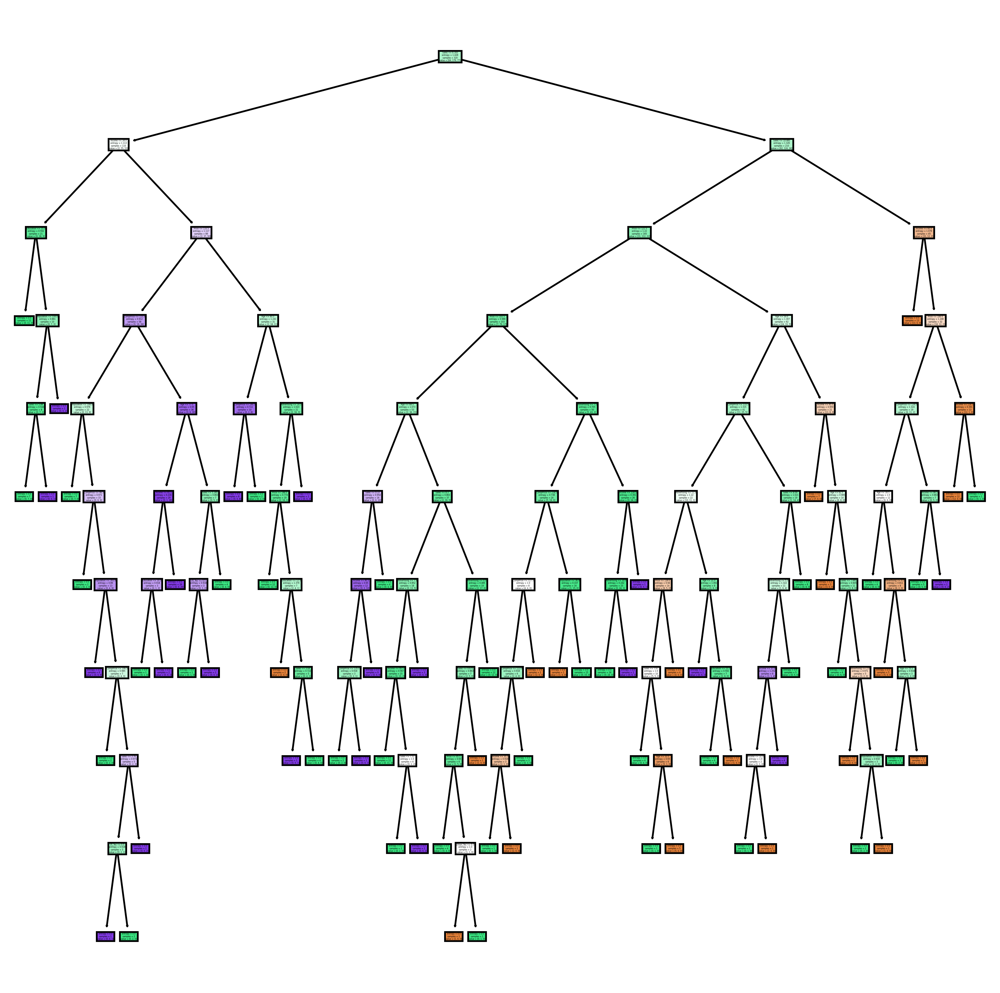

In [37]:
tree.plot_tree(dt,feature_names=x.columns.tolist(),filled=True)

In [38]:
dt.feature_importances_ #It return information gain of all columns

array([0.29404817, 0.10371078, 0.14029164, 0.10565397, 0.05297752,
       0.12255686, 0.12809759, 0.03622608, 0.0043776 , 0.01205979])

In [39]:
x.columns

Index(['Sales', 'CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'Age', 'Education', 'Urban_Yes', 'US_Yes'],
      dtype='object')

# CART

In [40]:
dtc = DecisionTreeClassifier(criterion='gini')

In [41]:
dtc.fit(xtrain,ytrain)
ypred = dtc.predict(xtest)

In [42]:
print(classification_report(ytest,ypred))

              precision    recall  f1-score   support

           1       0.76      0.62      0.68        21
           2       0.56      0.57      0.57        40
           3       0.32      0.37      0.34        19

    accuracy                           0.54        80
   macro avg       0.55      0.52      0.53        80
weighted avg       0.56      0.54      0.54        80



In [43]:
dtc.score(xtrain,ytrain), dtc.score(xtest,ytest)

(1.0, 0.5375)

# Regression

In [44]:
df

,Sales,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,9.50,138,73,11,276,120,3,42,17,1,1
1,11.22,111,48,16,260,83,1,65,10,1,1
2,10.06,113,35,10,269,80,2,59,12,1,1
3,7.40,117,100,4,466,97,2,55,14,1,1
4,4.15,141,64,3,340,128,3,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...,...
395,12.57,138,108,17,203,128,1,33,14,1,1
396,6.14,139,23,3,37,120,2,55,11,0,1
397,7.41,162,26,12,368,159,2,40,18,1,1
398,5.94,100,79,7,284,95,3,50,12,1,1


In [45]:
y=df['Sales']
x=df.iloc[:,1:]
x

,CompPrice,Income,Advertising,Population,Price,ShelveLoc,Age,Education,Urban_Yes,US_Yes
0,138,73,11,276,120,3,42,17,1,1
1,111,48,16,260,83,1,65,10,1,1
2,113,35,10,269,80,2,59,12,1,1
3,117,100,4,466,97,2,55,14,1,1
4,141,64,3,340,128,3,38,13,1,0
...,...,...,...,...,...,...,...,...,...,...
395,138,108,17,203,128,1,33,14,1,1
396,139,23,3,37,120,2,55,11,0,1
397,162,26,12,368,159,2,40,18,1,1
398,100,79,7,284,95,3,50,12,1,1


In [46]:
dtr = DecisionTreeRegressor()

dtr.fit(xtrain,ytrain)
yp = dtr.predict(xtest)
yp

array([3., 1., 2., 3., 2., 2., 1., 3., 2., 1., 3., 2., 2., 3., 1., 1., 2.,
       2., 2., 3., 1., 1., 3., 3., 2., 3., 1., 3., 2., 1., 1., 2., 3., 2.,
       2., 2., 3., 2., 1., 2., 3., 1., 2., 2., 1., 2., 2., 2., 2., 2., 3.,
       2., 3., 2., 1., 3., 3., 2., 3., 2., 2., 2., 2., 2., 2., 3., 1., 2.,
       2., 2., 2., 3., 2., 2., 2., 1., 2., 3., 1., 1.])

In [47]:
dtr.score(xtrain,ytrain), dtr.score(xtest,ytest)#model is overfitted because train score and test score has lots of differnce

(1.0, -0.37672090112640766)

In [48]:
x.columns

Index(['CompPrice', 'Income', 'Advertising', 'Population', 'Price',
       'ShelveLoc', 'Age', 'Education', 'Urban_Yes', 'US_Yes'],
      dtype='object')

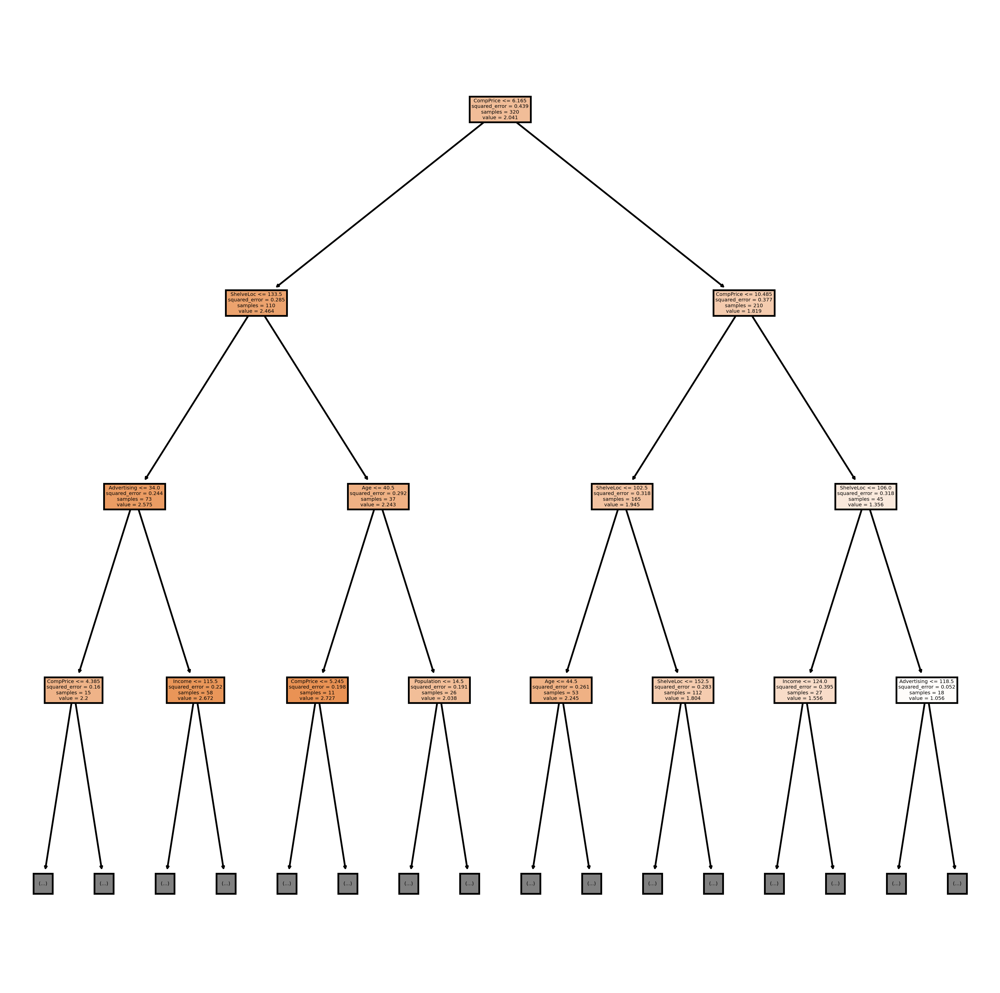

In [49]:
tree.plot_tree(dtr, feature_names=list(x.columns),max_depth=3, filled=True)
plt.show()

# Hyperparameter tuning


In [50]:
from sklearn.model_selection import GridSearchCV

In [51]:
params = {
    'criterion' : ['squared_error','absolute_error'],
    'max_depth' : [3,5,7,9,11],
    'splitter' :['best','random']
}

In [52]:
grid = GridSearchCV(estimator=DecisionTreeRegressor(), param_grid=params,
                   verbose=1)

In [53]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [3, 5, 7, 9, 11],
                         'splitter': ['best', 'random']},
             verbose=1)

In [54]:
grid.best_params_

{'criterion': 'squared_error', 'max_depth': 3, 'splitter': 'best'}

In [55]:
dtr = DecisionTreeRegressor(criterion='squared_error',
                           max_depth=3,splitter='best')

In [56]:
dtr.fit(xtrain,ytrain)
ypred  = dtr.predict(xtest)

In [57]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest)#there is still a 10% differnce between test and train score

(0.43461833903248104, 0.3293140935315161)

In [58]:
params = {
    'criterion' : ['squared_error','absolute_error'],
    'max_depth' : [1,2,3,4,5,6,7,8,9,10,11,12],
    'splitter' :['best','random']
}

In [59]:
grid = GridSearchCV(estimator=DecisionTreeRegressor(), param_grid=params,
                   verbose=1)

In [60]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 48 candidates, totalling 240 fits


GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                         'splitter': ['best', 'random']},
             verbose=1)

In [61]:
grid.best_params_

{'criterion': 'squared_error', 'max_depth': 4, 'splitter': 'random'}

In [62]:
dtr = DecisionTreeRegressor(criterion='squared_error',
                           max_depth=4,splitter='random')

In [63]:
dtr.fit(xtrain,ytrain)
ypred  = dtr.predict(xtest)

In [64]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest)

(0.32942550532355297, 0.2664445147053276)

In [65]:
params = {
    'criterion' : ['squared_error','absolute_error','friedman_mse'],
    'max_depth' : [1,2,3,4,5,6,7,8,9,10,11,12],
    'splitter' :['best','random']
}

In [66]:
grid = GridSearchCV(estimator=DecisionTreeRegressor(), param_grid=params,
                   verbose=1)

In [67]:
grid.fit(xtrain,ytrain)

Fitting 5 folds for each of 72 candidates, totalling 360 fits


GridSearchCV(estimator=DecisionTreeRegressor(),
             param_grid={'criterion': ['squared_error', 'absolute_error',
                                       'friedman_mse'],
                         'max_depth': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12],
                         'splitter': ['best', 'random']},
             verbose=1)

In [68]:
grid.best_params_

{'criterion': 'squared_error', 'max_depth': 2, 'splitter': 'best'}

In [69]:
dtr = DecisionTreeRegressor(criterion='squared_error',
                           max_depth=2,splitter='best')

In [70]:
dtr.fit(xtrain,ytrain)
ypred  = dtr.predict(xtest)

In [71]:
dtr.score(xtrain,ytrain),dtr.score(xtest,ytest) 

(0.32038616791176877, 0.2872578295998124)